<a href="https://colab.research.google.com/github/opethaiwoh/Early-Detection-of-Alzheimer-Diseases/blob/main/Final_ViT_a.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### installing all Python dependencies

In [ ]:
#!pip install pydicom

In [ ]:
#!pip install keras-tuner

In [ ]:
#!pip install seaborn

In [ ]:
#!pip install scikit-image

In [ ]:
#!pip install timm

In [ ]:
#!pip install tensorflow timm

In [ ]:
#!pip install tensorflow timm pydicom

In [ ]:
#!pip install onnx-tf

In [ ]:
#!pip install vit-keras

In [ ]:
#!pip install --upgrade tensorflow

In [ ]:
#!pip install vit-keras

In [ ]:
#!pip install lime

In [ ]:
#!pip install tf2torch

In [ ]:
#!pip install grad-cam

In [ ]:
#pip install tf-keras-vis

In [ ]:
#pip install lime

In [ ]:
#pip install tensorflow-addons

In [ ]:
#pip install --upgrade tensorflow

In [ ]:
import os
import random
import pandas as pd
import pydicom
import cv2
import tensorflow as tf
import numpy as np
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from vit_keras import vit
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50
import random
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from skimage.transform import resize
import tensorflow as tf
from skimage.segmentation import mark_boundaries
from lime.lime_image import LimeImageExplainer
import matplotlib.patches as patches
from lime.wrappers.scikit_image import SegmentationAlgorithm
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils import normalize
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from lime import lime_image
from tensorflow.keras.layers import (Conv2D,MaxPooling2D,Flatten,Dense,Dropout,BatchNormalization,)
from sklearn.metrics import classification_report
from tensorflow.keras.layers import Dense, Flatten, LayerNormalization
import tensorflow_addons as tfa
from vit_keras import vit

C:\Users\ajala\AppData\Roaming\Python\Python311\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\ajala\AppData\Roaming\Python\Python311\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.14.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file

In [ ]:
# Load CSV file
csv_path = "C://Users//ajala//Downloads//OPEYEMI//AD_1000.csv"
df = pd.read_csv(csv_path)
df.head()

,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded
0,I1221058,002_S_0413,CN,F,90,y2,MRI,Sagittal 3D FLAIR,Original,8/27/19,DCM,9/11/23
1,I1221059,002_S_0413,CN,F,90,y2,MRI,HighResHippocampus,Original,8/27/19,DCM,9/11/23
2,I1221060,002_S_0413,CN,F,90,y2,MRI,Axial 3TE T2 STAR,Original,8/27/19,DCM,9/11/23
3,I1221061,002_S_0413,CN,F,90,y2,MRI,Axial 3TE T2 STAR,Original,8/27/19,DCM,9/11/23
4,I1221062,002_S_0413,CN,F,90,y2,MRI,Field Mapping,Original,8/27/19,DCM,9/11/23


In [ ]:
def list_dicom_files(start_path):
    dicom_files = []

    for dirpath, _, filenames in os.walk(start_path):
        for file in filenames:
            if file.endswith('.dcm'):
                dicom_files.append(os.path.join(dirpath, file))

    return dicom_files

base_path = "C://Users//ajala//Downloads//OPEYEMI//AD_ALL_1000//ADNI"
dicom_files = list_dicom_files(base_path)
print(len(dicom_files))

70706


In [ ]:
# Listing DICOM files
def list_dicom_files(start_path):
    return [os.path.join(dirpath, file) for dirpath, _, filenames in os.walk(start_path) for file in filenames if file.endswith('.dcm')]

# Label Mapping
def get_label(img_path):
    filename_parts = os.path.basename(img_path).split('_')
    subject = '_'.join(filename_parts[1:4])
    filtered_df = df[df['Subject'] == subject]

    if filtered_df.empty:
        print(f"No matching rows found for Subject: {subject}")
        return -1

    label = filtered_df['Group'].values[0]
    if label == 'CN':
        return 0
    elif label == 'MCI':
        return 1
    elif label == 'AD':
        return 2
    else:
        print(f"Unexpected label value: {label} for Subject: {subject}")
        return -1



In [ ]:
# Convert medical images from the DICOM format to a regular RGB format.
def dicom_to_rgb(dcm):
    pixel_array = dcm.pixel_array
    pixel_array = cv2.normalize(pixel_array, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    pixel_array = cv2.cvtColor(pixel_array, cv2.COLOR_GRAY2RGB)
    return pixel_array

In [ ]:
# Performing Data Augmentation
def augment(img, label):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.rot90(img, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
    return img, label

In [ ]:
# load MRI images stored in the DICOM format,Re-size and Normalize
def load_data(img_path):
    img_path = img_path.numpy().decode('utf-8')
    dcm = pydicom.dcmread(img_path)
    img = dicom_to_rgb(dcm)

    # Resize and Normalize
    img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_AREA)
    img = img / 255.0

    label = get_label(img_path)
    return img, label

In [ ]:
# load image data and its corresponding label from a given image path tensor using TensorFlow operations.
def load_tf_dataset(img_path_tensor):
    img, label = tf.py_function(func=load_data, inp=[img_path_tensor], Tout=[tf.float32, tf.int64])
    img.set_shape([224, 224, 3])
    label.set_shape([])
    return img, label

In [ ]:
# Create a TensorFlow tf.data.Dataset from a list of image paths
def prepare_dataset(image_paths, augment_func=None):
    dataset = tf.data.Dataset.from_tensor_slices(image_paths)
    dataset = dataset.map(load_tf_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    if augment_func:
        dataset = dataset.map(augment_func, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE).shuffle(len(image_paths)).prefetch(tf.data.AUTOTUNE)
    return dataset

In [ ]:
# Convert the TensorFlow dataset to numpy arrays
def dataset_to_numpy(tf_dataset, num_samples):
    images_np = np.zeros((num_samples, 224, 224, 3), dtype=np.float32)
    labels_np = np.zeros((num_samples,), dtype=np.int64)

    for i, (img, label) in enumerate(tf_dataset.unbatch().take(num_samples)):
        images_np[i] = img.numpy()
        labels_np[i] = label.numpy()

    return images_np, labels_np

In [ ]:
# Get and Normalize the DICOM files
def preprocess_image(dicom_path):
    # Load the DICOM file
    dcm = pydicom.dcmread(dicom_path)

    # Convert to RGB
    img = dicom_to_rgb(dcm)

    # Resize and Normalize
    img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_AREA)
    img = img / 255.0

    return img

In [ ]:
# Load CSV file
csv_path = "C://Users//ajala//Downloads//OPEYEMI//AD_1000.csv"
df = pd.read_csv(csv_path)

# Create a list of DICOM image paths
base_path = "C://Users//ajala//Downloads//OPEYEMI//AD_ALL_1000//ADNI"
image_paths = list_dicom_files(base_path)
print(f"Total DICOM files: {len(image_paths)}")

Total DICOM files: 70706


In [ ]:
# Separate image paths based on classes
paths_CN = [path for path in image_paths if get_label(path) == 0]
paths_MCI = [path for path in image_paths if get_label(path) == 1]
paths_AD = [path for path in image_paths if get_label(path) == 2]

In [ ]:
# Modifying the function to get the list of all images in each of the classes
def list_dicom_files(base_path):
    """Recursively list all DICOM files in a directory."""
    dicom_files = []
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.lower().endswith(".dcm"):
                dicom_files.append(os.path.join(root, file))
    return dicom_files

# Display the number of images in each class
print(f"Number of CN images: {len(paths_CN)}")
print(f"Number of MCI images: {len(paths_MCI)}")
print(f"Number of AD images: {len(paths_AD)}")

Number of CN images: 25899
Number of MCI images: 30575
Number of AD images: 14232


In [ ]:
# Ensure only 10 samples are selected for each class
paths_CN = paths_CN[:500]
paths_MCI = paths_MCI[:500]
paths_AD = paths_AD[:500]

In [ ]:
# Calculate the train/test split samples per class based on the total available images
train_ratio = 0.8
train_samples_CN = int(len(paths_CN) * train_ratio)
test_samples_CN = len(paths_CN) - train_samples_CN

train_samples_MCI = int(len(paths_MCI) * train_ratio)
test_samples_MCI = len(paths_MCI) - train_samples_MCI

train_samples_AD = int(len(paths_AD) * train_ratio)
test_samples_AD = len(paths_AD) - train_samples_AD

In [ ]:
# Split image paths for training and test for each class
train_paths_CN = paths_CN[:train_samples_CN]
test_paths_CN = paths_CN[train_samples_CN:]

train_paths_MCI = paths_MCI[:train_samples_MCI]
test_paths_MCI = paths_MCI[train_samples_MCI:]

train_paths_AD = paths_AD[:train_samples_AD]
test_paths_AD = paths_AD[train_samples_AD:]

In [ ]:
# Combine paths from all classes for training and test datasets
train_image_paths = train_paths_CN + train_paths_MCI + train_paths_AD
test_image_paths = test_paths_CN + test_paths_MCI + test_paths_AD

# Shuffle the datasets
random.shuffle(train_image_paths)
random.shuffle(test_image_paths)

In [ ]:
# Print the number of samples in training and test datasets
print(f"Number of training samples: {len(train_image_paths)}")
print(f"Number of test samples: {len(test_image_paths)}")

Number of training samples: 1200
Number of test samples: 300


In [ ]:
# Calculate and print the class distribution for the training dataset
train_class_distribution = {
    'CN': len(train_paths_CN),
    'MCI': len(train_paths_MCI),
    'AD': len(train_paths_AD)
}
print(f"Training data distribution - CN: {train_class_distribution['CN']}, MCI: {train_class_distribution['MCI']}, AD: {train_class_distribution['AD']}")

Training data distribution - CN: 400, MCI: 400, AD: 400


In [ ]:
# Calculate and print the class distribution for the test dataset
test_class_distribution = {
    'CN': len(test_paths_CN),
    'MCI': len(test_paths_MCI),
    'AD': len(test_paths_AD)
}
print(f"Test data distribution - CN: {test_class_distribution['CN']}, MCI: {test_class_distribution['MCI']}, AD: {test_class_distribution['AD']}")


Test data distribution - CN: 100, MCI: 100, AD: 100


In [ ]:
# The size of the mini-batches to be used during training
BATCH_SIZE = 24

In [ ]:
# Prepare the training and test datasets
train_dataset = prepare_dataset(train_image_paths, augment_func=augment)
test_dataset = prepare_dataset(test_image_paths, augment_func=None).shuffle(len(test_image_paths)).prefetch(tf.data.AUTOTUNE)

In [ ]:
# Convert the training and test datasets to numpy arrays
train_images, train_labels = dataset_to_numpy(train_dataset, len(train_image_paths))
test_images, test_labels = dataset_to_numpy(test_dataset, len(test_image_paths))

In [ ]:
#print the class distribution for the training dataset
print(train_images.shape)  # Expected to print (24, 224, 224, 3)
print(train_labels.shape)  # Expected to print (24,)
print(test_images.shape)   # Expected to print (6, 224, 224, 3)
print(test_labels.shape)   # Expected to print (6,)

(1200, 224, 224, 3)
(1200,)
(300, 224, 224, 3)
(300,)


In [ ]:
#Defining the numbers of classes

# Extract labels for each DICOM file
all_labels = [get_label(file) for file in dicom_files]

# Remove any -1 values (which indicates an error)
all_labels = [label for label in all_labels if label != -1]

# Compute the number of unique classes
num_classes = len(set(all_labels))

print(f"Number of unique classes: {num_classes}")

Number of unique classes: 3


In [ ]:
# Set the input shape and number of classes
input_shape = (224, 224, 3)

# Define class names (replace with your class names)
class_names = ['CN', 'MCI', 'AD']

# Update it to your number of classes
num_classes = 3


In [ ]:
def create_vit_classifier():
    model = vit.vit_b16(  # changed from vit_b32 to vit_b16
        image_size=input_shape[0],
        activation='softmax',
        pretrained=True,
        include_top=True,
        pretrained_top=False,
        classes=num_classes
    )
    return model


In [ ]:
# Create the ViT model
model = create_vit_classifier()

# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

347502902/347502902 [==============================] - 6s 0us/step


C:\Users\ajala\AppData\Roaming\Python\Python311\site-packages\vit_keras\utils.py:81: UserWarning: Resizing position embeddings from 24, 24 to 14, 14
  warnings.warn(


In [ ]:
# Fit the model
history = model.fit(
    train_images,
    train_labels,
    validation_data=(test_images, test_labels),
    batch_size=BATCH_SIZE,
    epochs=15,  # you might need to adjust the number of epochs
)

# Evaluate the model
test_loss, test_acc = model.evaluate(test_images, test_labels)
print(f"Test accuracy: {test_acc:.4f}")

Epoch 1/15
50/50 [==============================] - 422s 8s/step - loss: 1.6189 - accuracy: 0.3400 - val_loss: 1.0937 - val_accuracy: 0.5400
Epoch 2/15
50/50 [==============================] - 403s 8s/step - loss: 1.1265 - accuracy: 0.4133 - val_loss: 0.9157 - val_accuracy: 0.5133
Epoch 3/15
50/50 [==============================] - 398s 8s/step - loss: 0.9420 - accuracy: 0.5142 - val_loss: 1.1159 - val_accuracy: 0.4267
Epoch 4/15
50/50 [==============================] - 398s 8s/step - loss: 0.9140 - accuracy: 0.5558 - val_loss: 0.8827 - val_accuracy: 0.5267
Epoch 5/15
50/50 [==============================] - 399s 8s/step - loss: 0.8377 - accuracy: 0.6042 - val_loss: 0.8555 - val_accuracy: 0.4767
Epoch 6/15
50/50 [==============================] - 398s 8s/step - loss: 0.6633 - accuracy: 0.6883 - val_loss: 0.6688 - val_accuracy: 0.6967
Epoch 7/15
50/50 [==============================] - 403s 8s/step - loss: 0.6803 - accuracy: 0.6950 - val_loss: 0.6398 - val_accuracy: 0.6433
Epoch 8/15
50

In [ ]:
# Print the model summary to identify the correct layer name
model.summary()

Model: "vit-b16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 embedding (Conv2D)          (None, 14, 14, 768)       590592    
                                                                 
 reshape (Reshape)           (None, 196, 768)          0         
                                                                 
 class_token (ClassToken)    (None, 197, 768)          768       
                                                                 
 Transformer/posembed_input  (None, 197, 768)          151296    
  (AddPositionEmbs)                                              
                                                                 
 Transformer/encoderblock_0  ((None, 197, 768),        7087872   
  (TransformerBlock)          (None, 12, None, None)       

In [ ]:
def show_predicted_images(images, labels, predictions, class_names):
    plt.figure(figsize=(12, 12))
    for i in range(min(12, len(images))):  # Display the first 12 images
        plt.subplot(3, 4, i + 1)
        plt.imshow(images[i])
        true_label = class_names[labels[i]]  # no need to use np.argmax
        predicted_label = class_names[predictions[i]]  # no need to use np.argmax
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}')
        plt.axis('off')
    plt.show()

10/10 [==============================] - 32s 3s/step


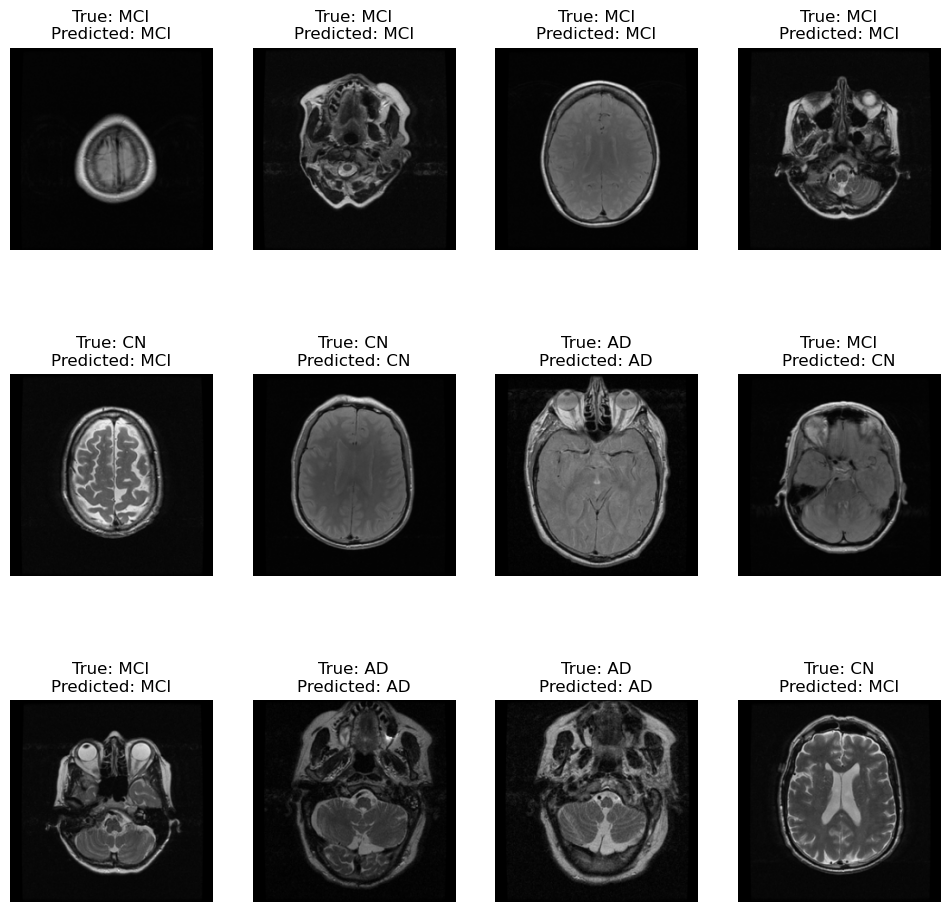

In [ ]:
# Make predictions on the test images
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)  # converting softmax output to class label

# Show the predicted images with labels
show_predicted_images(test_images, test_labels, predicted_labels, class_names)

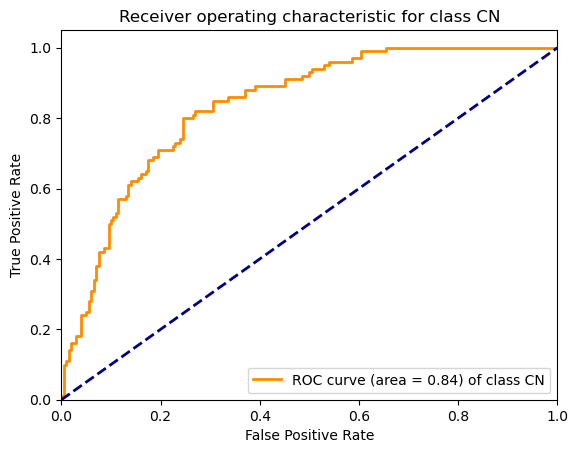

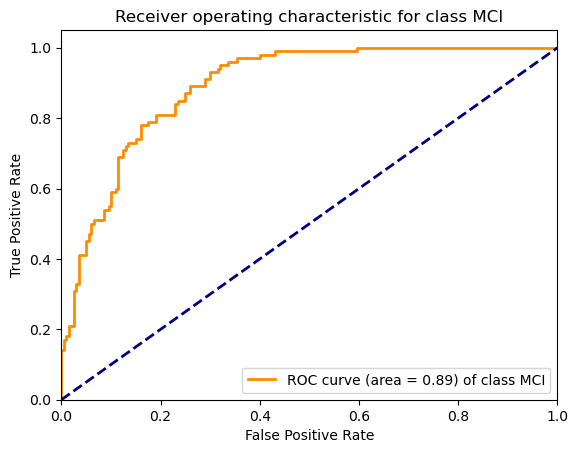

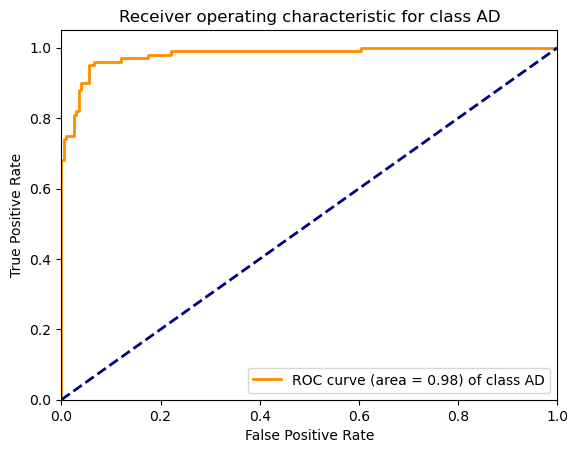

In [ ]:
# Define class names and number of classes
class_names = ['CN', 'MCI', 'AD']
num_classes = len(class_names)

# Binarize the labels
test_labels_bin = label_binarize(test_labels, classes=range(num_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curve for each class
for i in range(num_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], color='darkorange', lw=2,
             label='ROC curve (area = %0.2f) of class {0}'.format(class_names[i]) % roc_auc[i])
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for class {0}'.format(class_names[i]))
    plt.legend(loc="lower right")
    plt.show()


In [ ]:

# Convert predictions to label encoding
predictions_decoded = np.argmax(predictions, axis=1)

# Define class names
class_names = ['CN', 'MCI', 'AD']

# Print the classification report
print(classification_report(test_labels, predictions_decoded, target_names=class_names))

              precision    recall  f1-score   support

          CN       0.71      0.55      0.62       100
         MCI       0.69      0.75      0.72       100
          AD       0.83      0.96      0.89       100

    accuracy                           0.75       300
   macro avg       0.75      0.75      0.75       300
weighted avg       0.75      0.75      0.75       300



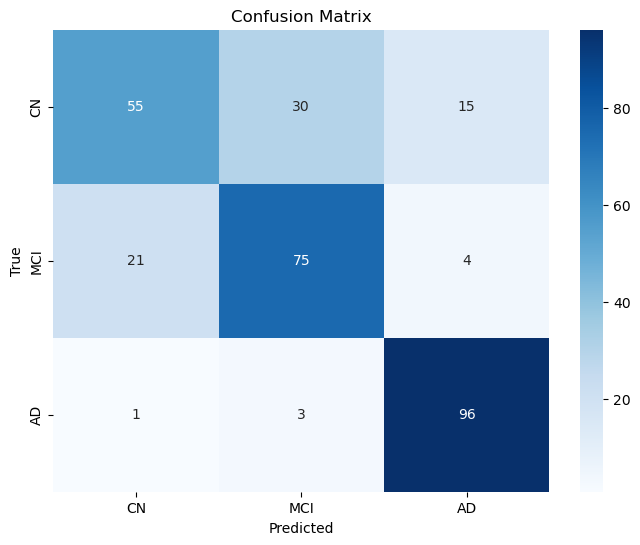

In [ ]:
# If test_labels is already in label encoded format (not one-hot encoded)
test_labels_decoded = test_labels

# Convert predictions to label encoded
predictions_decoded = np.argmax(predictions, axis=1)

# Calculate the confusion matrix
conf_matrix = confusion_matrix(test_labels_decoded, predictions_decoded)

# Define class names
class_names = ['CN', 'MCI', 'AD']  # Replace with your class names

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
#Extract the attention maps from specific layers of a given model for a provided input imag
def get_attention_maps(model, input_image):
    """Get the attention maps of the model for a given input image."""
    attention_layers = [layer for layer in model.layers if "MultiHeadAttention" in str(layer)]
    intermediate_model = tf.keras.Model(inputs=model.input,
                                        outputs=[layer.output for layer in attention_layers])
    intermediate_output = intermediate_model.predict(input_image)
    attention_maps = [output[1] for output in intermediate_output]
    return attention_maps

In [ ]:
#implement the Gradient-weighted Class Activation Mapping (Grad-CAM) technique
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.grad_model = tf.keras.Model(
            [self.model.inputs],
            [self.model.get_layer(self.target_layer).output, self.model.output]
        )

    def compute_gradcam(self, image, target_class):
        image_tensor = tf.expand_dims(tf.convert_to_tensor(image, dtype=tf.float32), axis=0)

        with tf.GradientTape() as tape:
            tape.watch(image_tensor)
            activations, predictions = self.grad_model(image_tensor)
            loss = predictions[0][target_class]

        grads = tape.gradient(loss, activations)
        grad_tensor = grads[0] if isinstance(grads, (list, tuple)) else grads
        pooled_grads = tf.reduce_mean(grad_tensor, axis=(0, 1))
        heatmap = tf.reduce_sum(pooled_grads * activations[0], axis=-1)
        heatmap = np.maximum(heatmap, 0) / np.max(heatmap) # Normalize
        heatmap = resize(heatmap, (image.shape[0], image.shape[1]))

        return heatmap

    def overlay_heatmap_on_image(self, heatmap, original_image):
        heatmap = np.uint8(255 * heatmap)
        original_image = np.uint8(255 * original_image)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        overlayed_img = heatmap * 0.4 + original_image
        return np.clip(overlayed_img, 0, 255)

gradcam_encoder = GradCAM(model=model, target_layer="Transformer/encoderblock_11")
gradcam_head = GradCAM(model=model, target_layer="head")

1/1 [==============================] - 0s 166ms/step


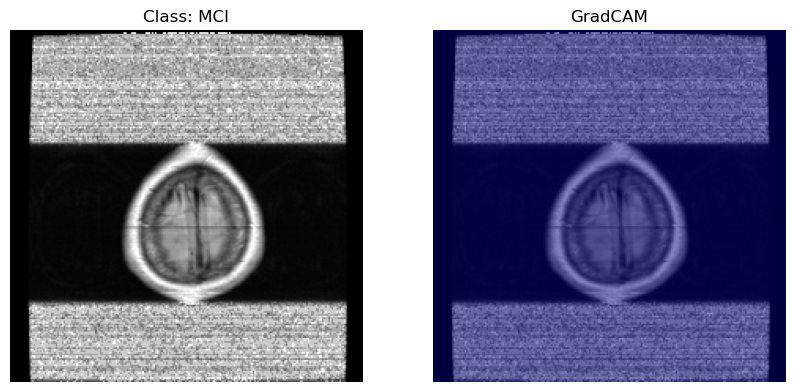

1/1 [==============================] - 0s 156ms/step


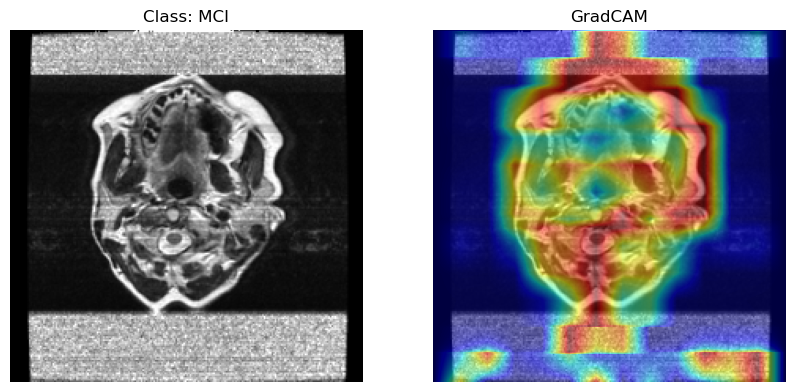

1/1 [==============================] - 0s 166ms/step


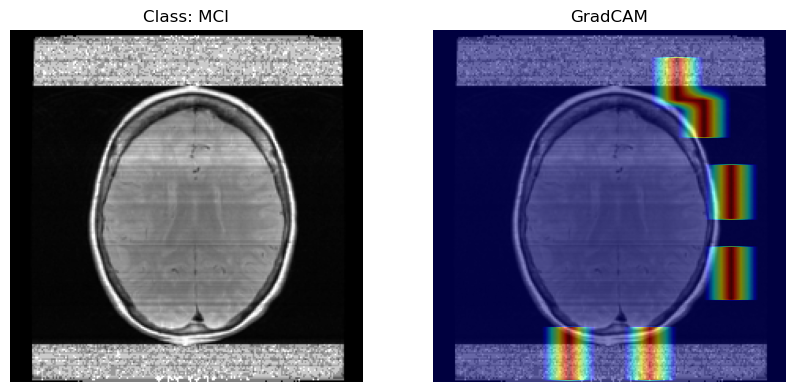

1/1 [==============================] - 0s 150ms/step


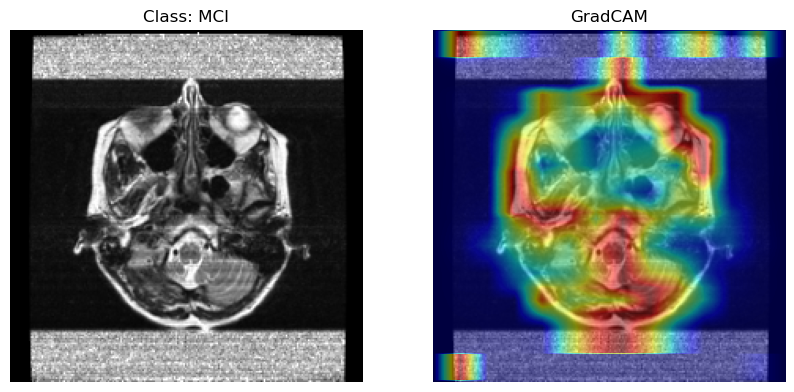

1/1 [==============================] - 0s 146ms/step


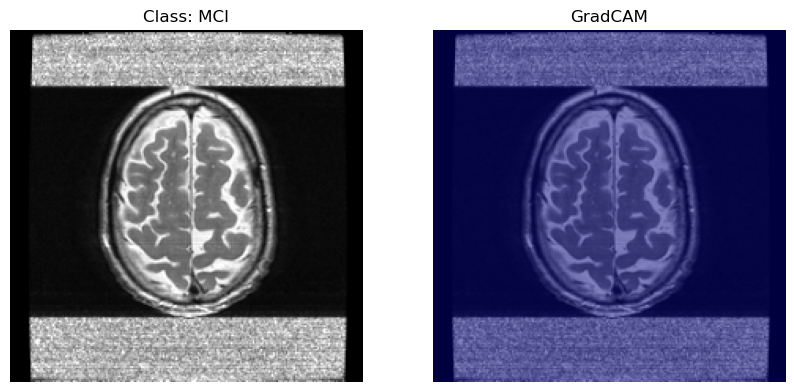

1/1 [==============================] - 0s 149ms/step


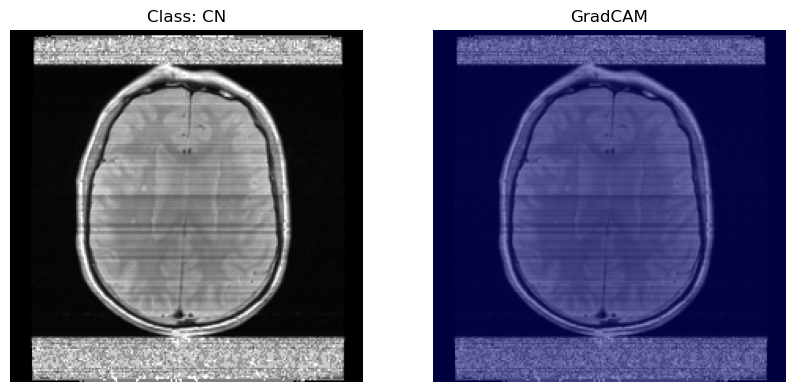

1/1 [==============================] - 0s 147ms/step


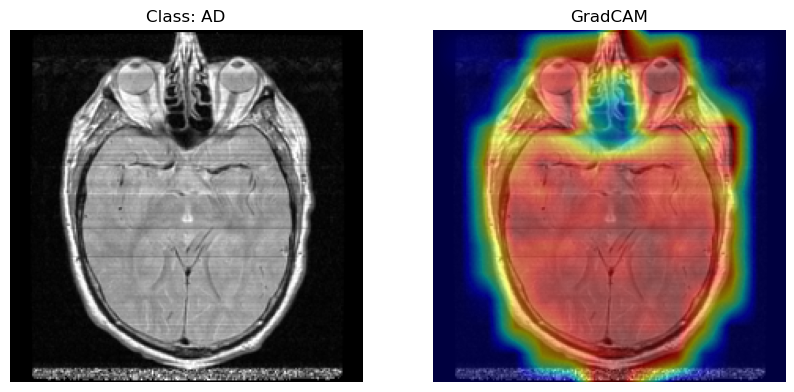

1/1 [==============================] - 0s 145ms/step


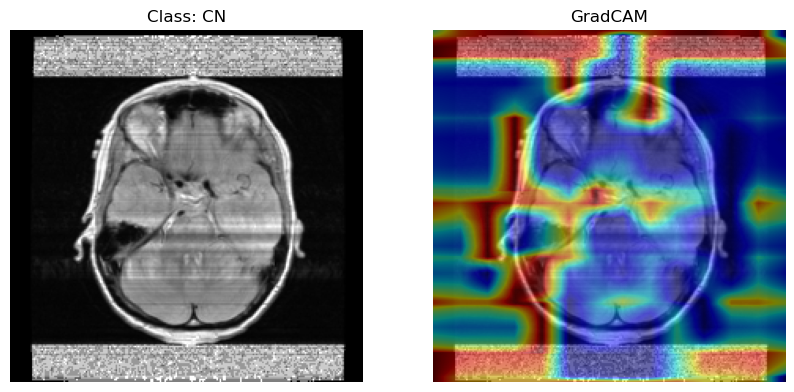

1/1 [==============================] - 0s 146ms/step


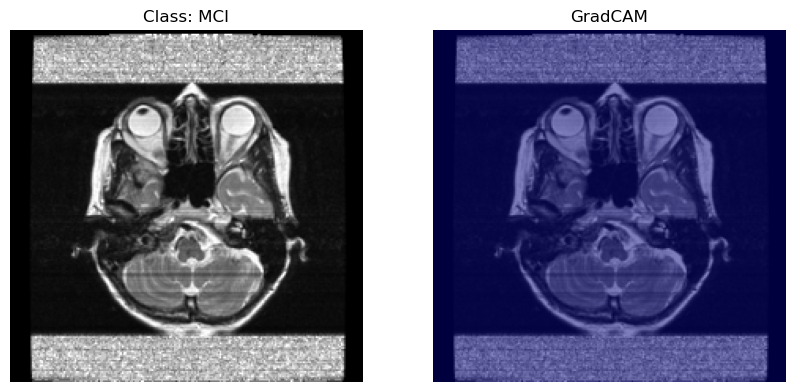

1/1 [==============================] - 0s 141ms/step


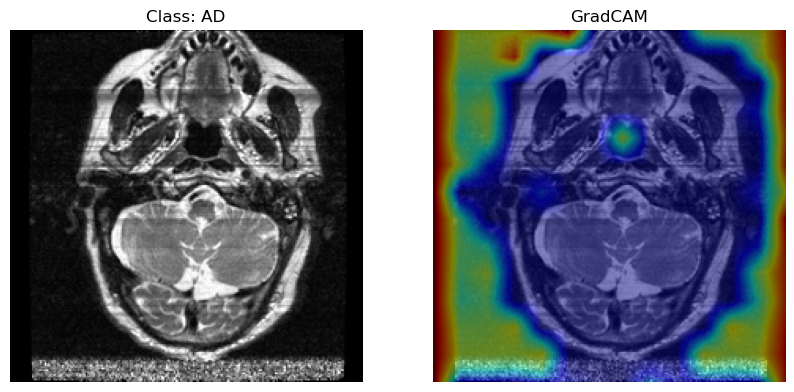

1/1 [==============================] - 0s 145ms/step


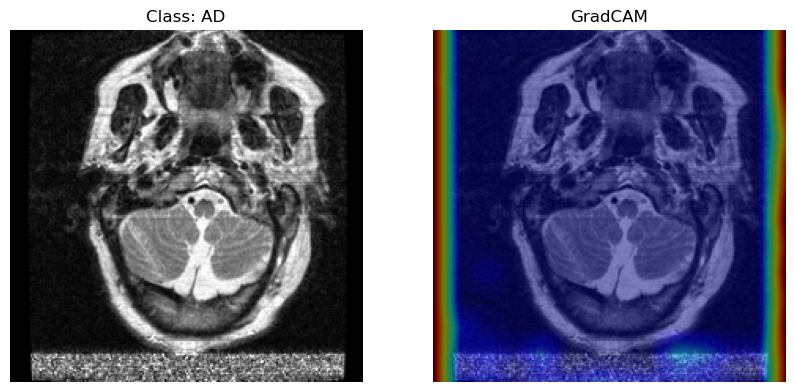

1/1 [==============================] - 0s 146ms/step


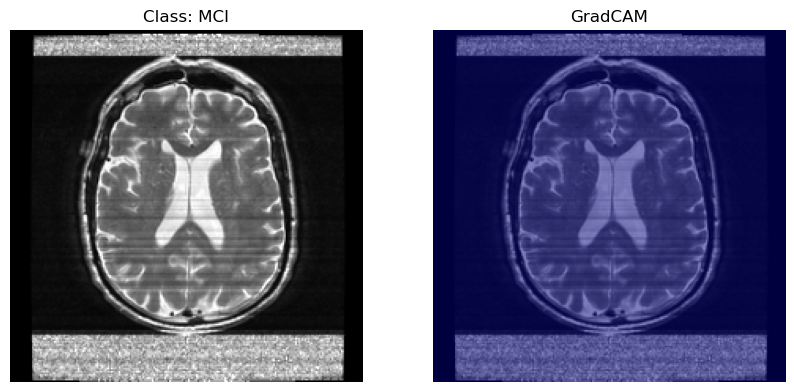

1/1 [==============================] - 0s 144ms/step


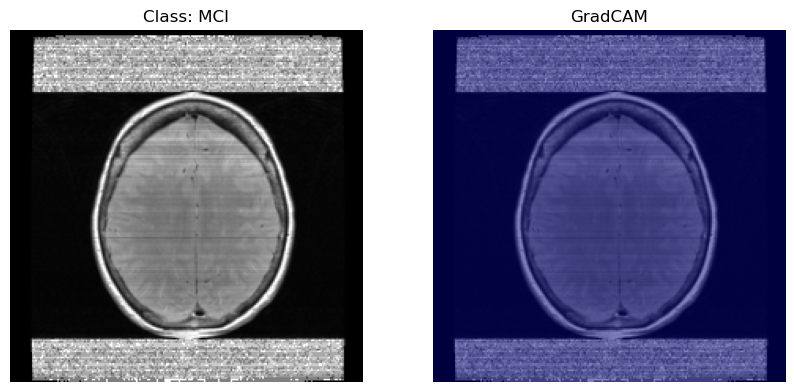

1/1 [==============================] - 0s 148ms/step


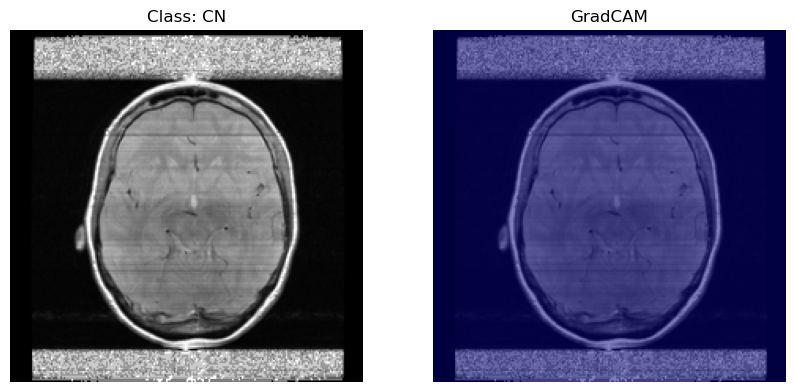

1/1 [==============================] - 0s 142ms/step


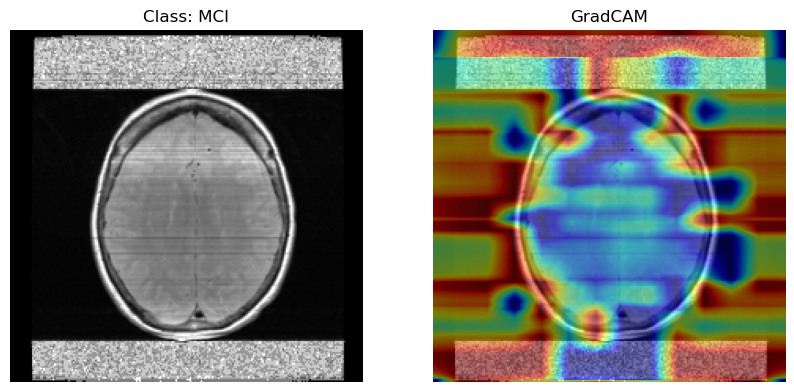

1/1 [==============================] - 0s 145ms/step


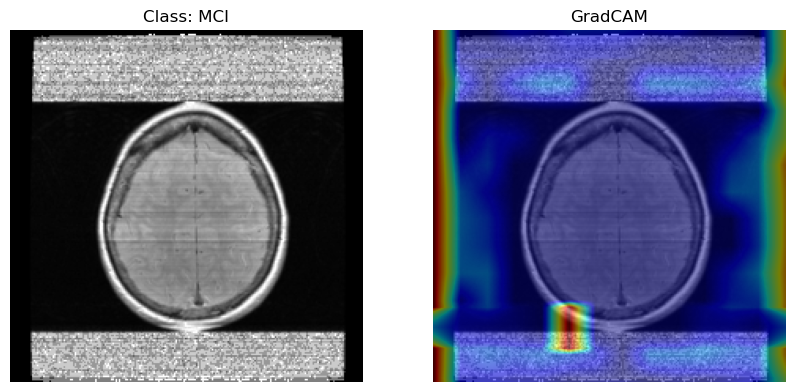

1/1 [==============================] - 0s 154ms/step


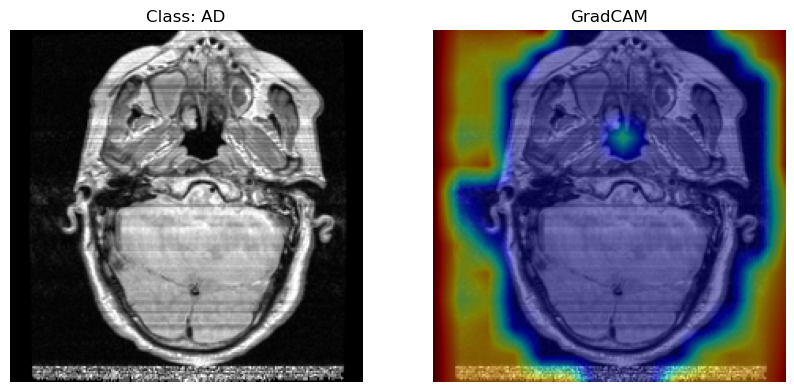

1/1 [==============================] - 0s 143ms/step


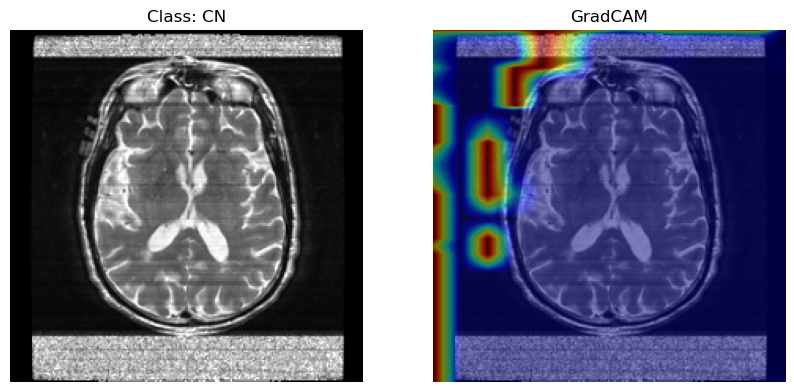

1/1 [==============================] - 0s 144ms/step


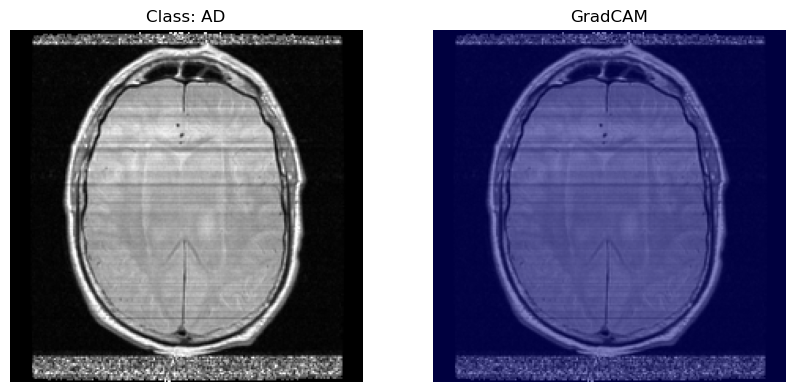

1/1 [==============================] - 0s 145ms/step


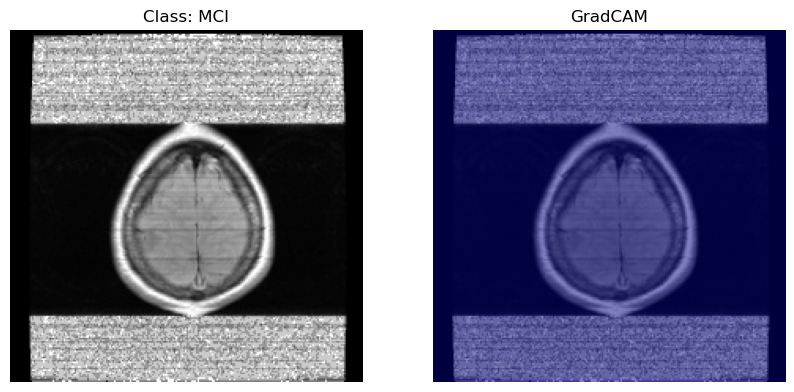

In [ ]:
# Function to get the prediction class
def predict_class(model, image):
    prediction = model.predict(np.expand_dims(image, axis=0))
    return np.argmax(prediction, axis=1)[0]

# Initialize Gradcam object
gradcam = Gradcam(model)

# Select 20 images for explanation
selected_images = test_images[:20]

# Define function for model prediction
def model_modifier(m):
    return m  # No modification needed

# Compute GradCAM
cam = gradcam(model_modifier,
              selected_images,
              penultimate_layer=-1,
              )

# Class names
class_names = ["CN", "MCI", "AD"]

# Plot the results
for i in range(20):
    # Predict class
    pred_class = predict_class(model, selected_images[i])

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display original image
    ax[0].imshow(normalize(selected_images[i]))
    ax[0].axis('off')
    ax[0].set_title(f'Class: {class_names[pred_class]}')

    # Display GradCAM heatmap
    ax[1].imshow(normalize(selected_images[i]))
    ax[1].imshow(normalize(cam[i]), cmap='jet', alpha=0.5)
    ax[1].axis('off')
    ax[1].set_title('GradCAM')

    plt.show()

In [ ]:
def show_images_side_by_side(original_img, lime_img, title=""):
    """Display original and LIME images side by side."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Original Image
    ax1.imshow(original_img)
    ax1.set_title(f"Original: {title}", fontsize=10)
    ax1.axis('off')

    # LIME Image with annotation
    ax2.imshow(lime_img)

    # Dummy bounding box coordinates (you might want to derive these from LIME masks)
    rect = patches.Rectangle((50,50), 100, 100, linewidth=1, edgecolor='r', facecolor='none')
    ax2.add_patch(rect)
    ax2.text(55, 45, 'Area of Interest', color='red', fontsize=8)

    ax2.set_title(f"LIME Explanation for {title}", fontsize=10)
    ax2.axis('off')

    plt.tight_layout()
    plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 980ms/step


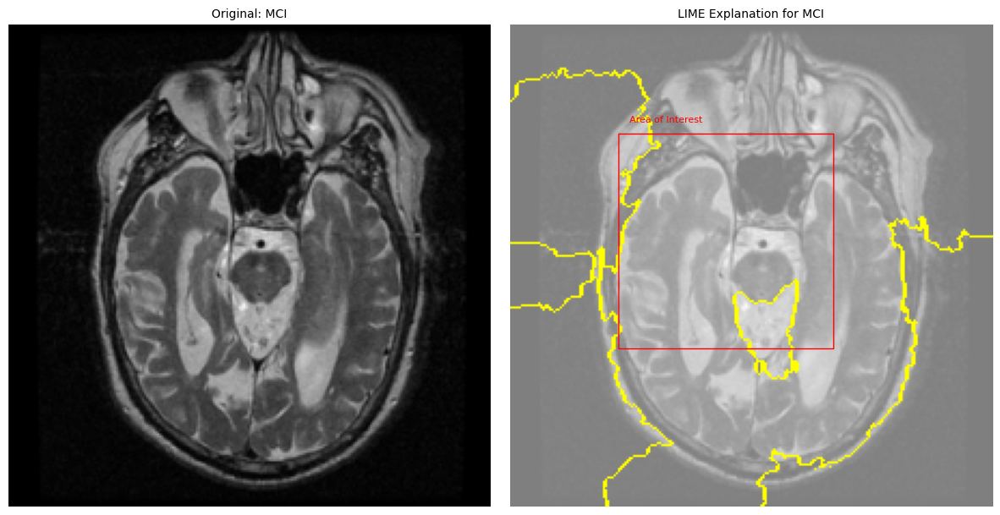

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


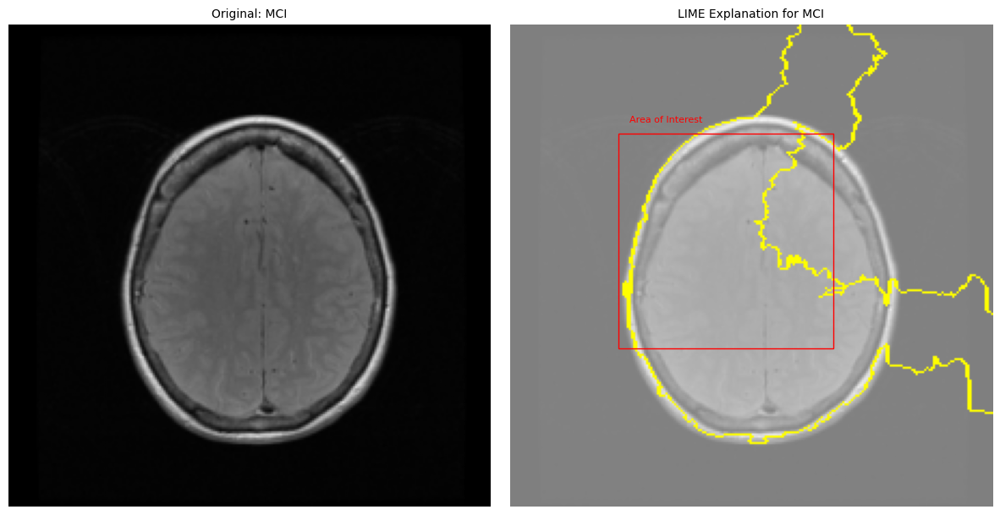

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 981ms/step


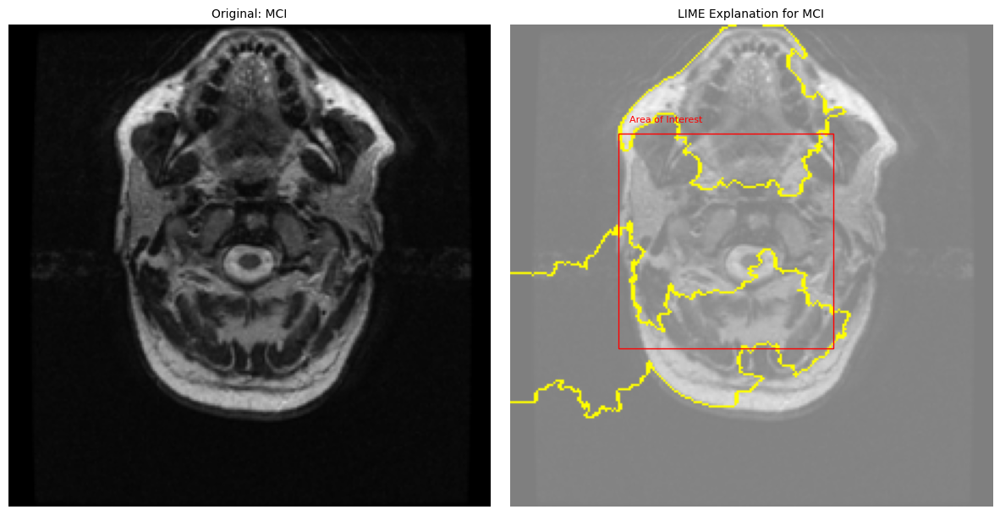

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 987ms/step


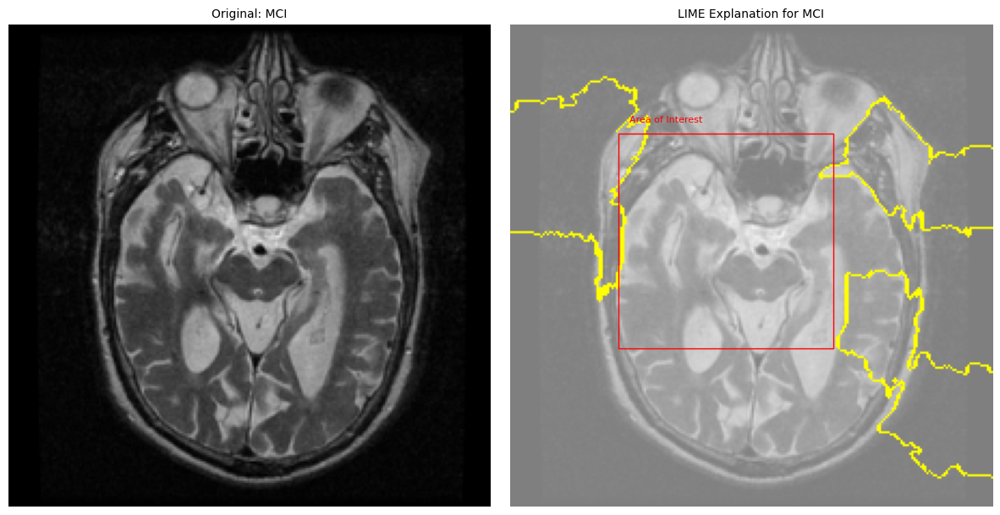

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 986ms/step


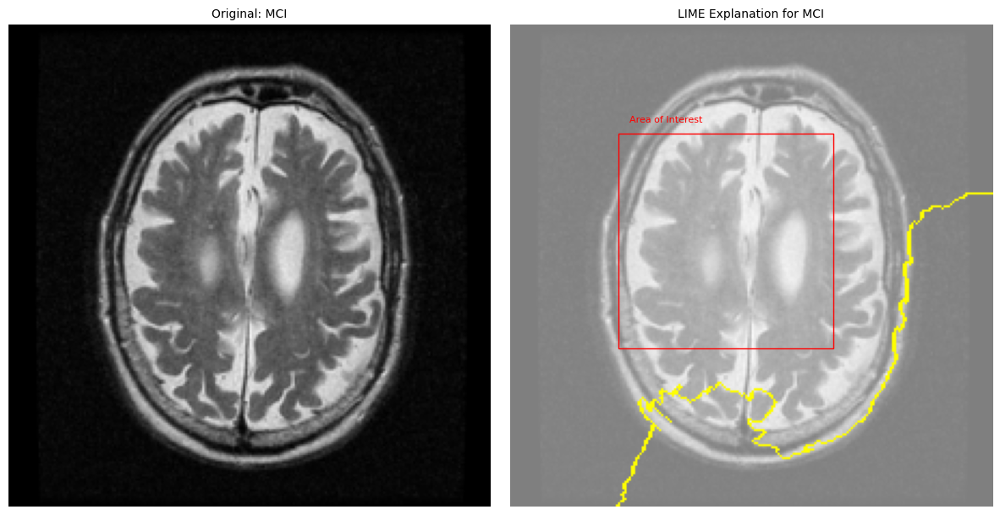

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


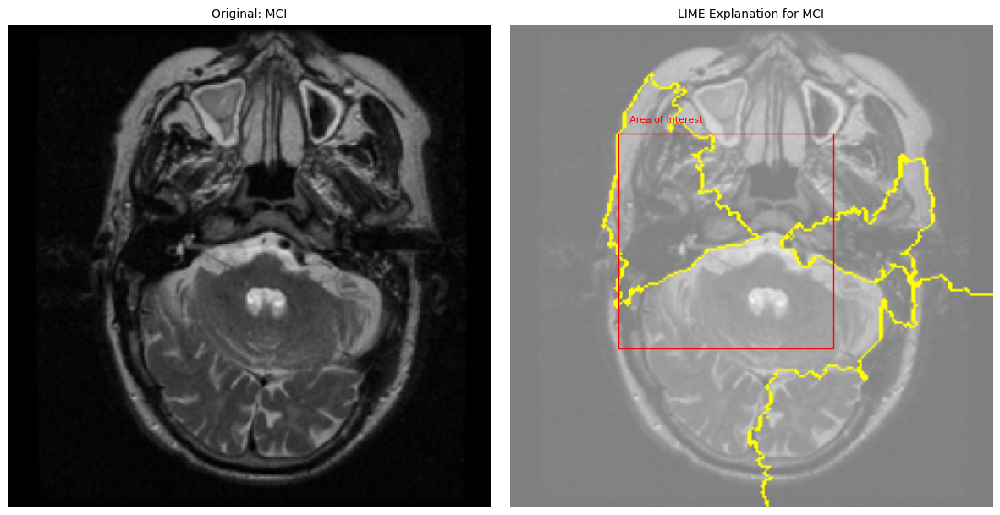

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 972ms/step


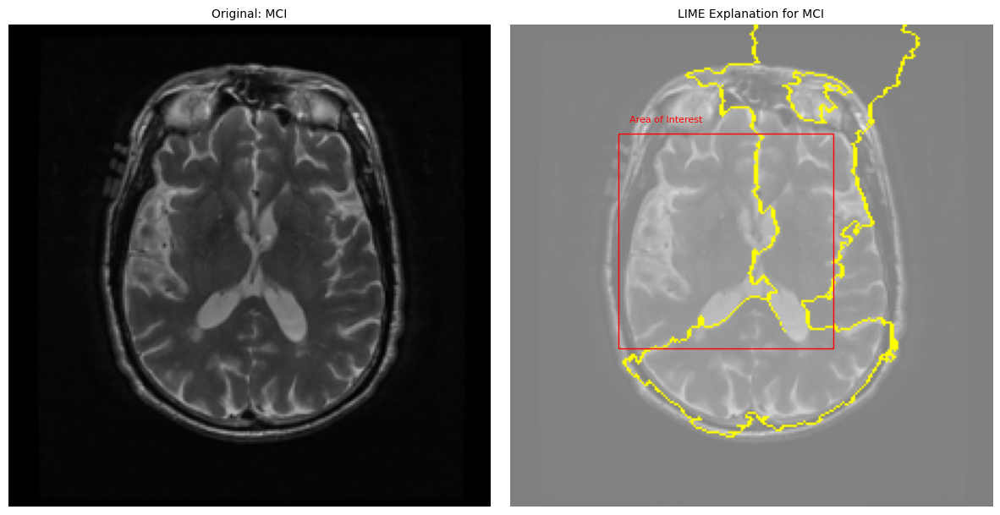

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


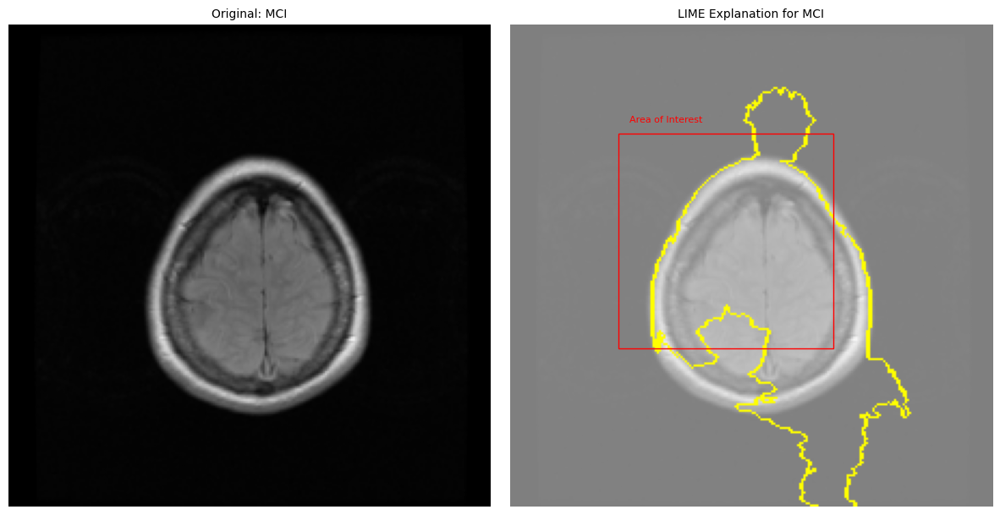

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 973ms/step


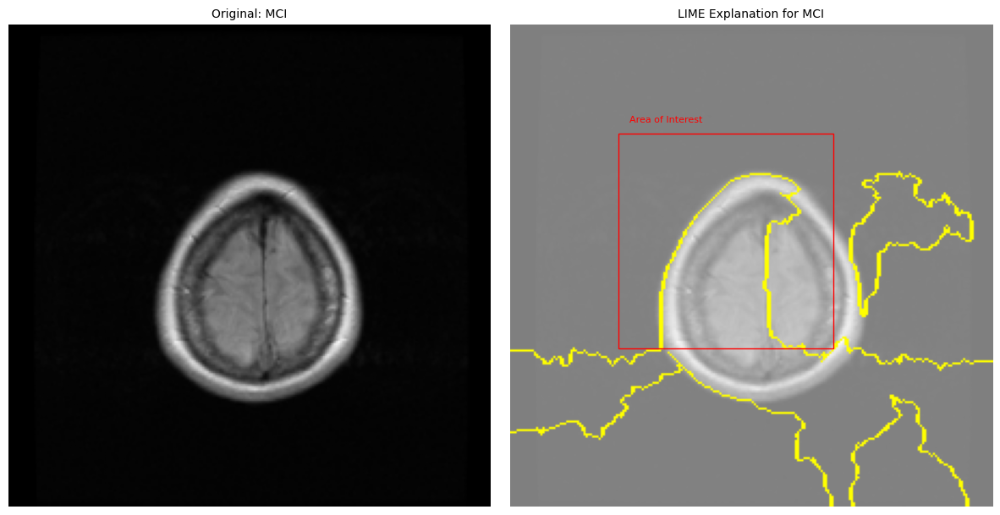

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


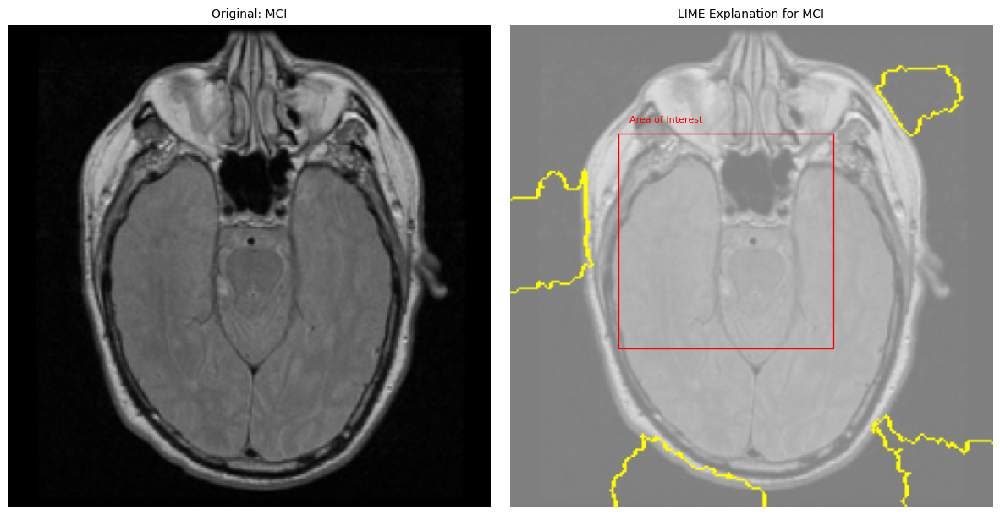

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 986ms/step


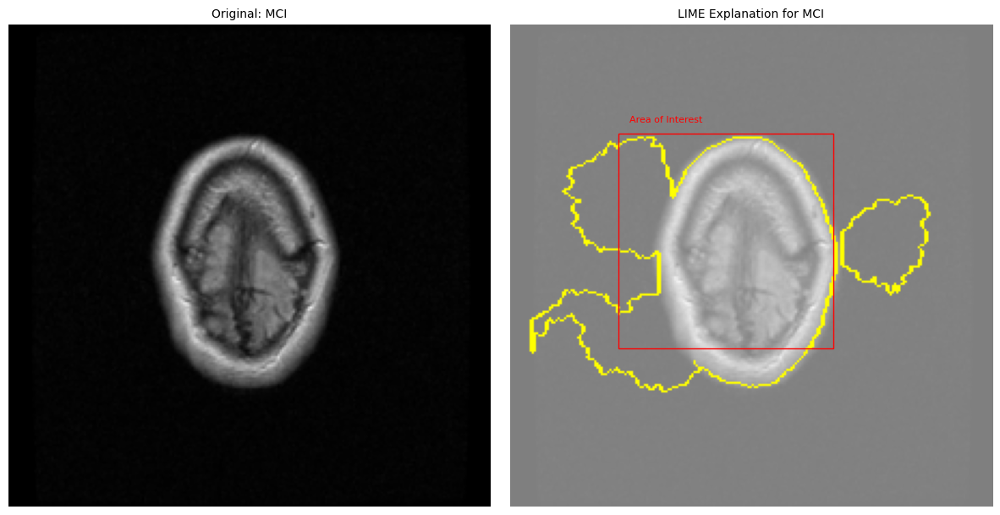

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


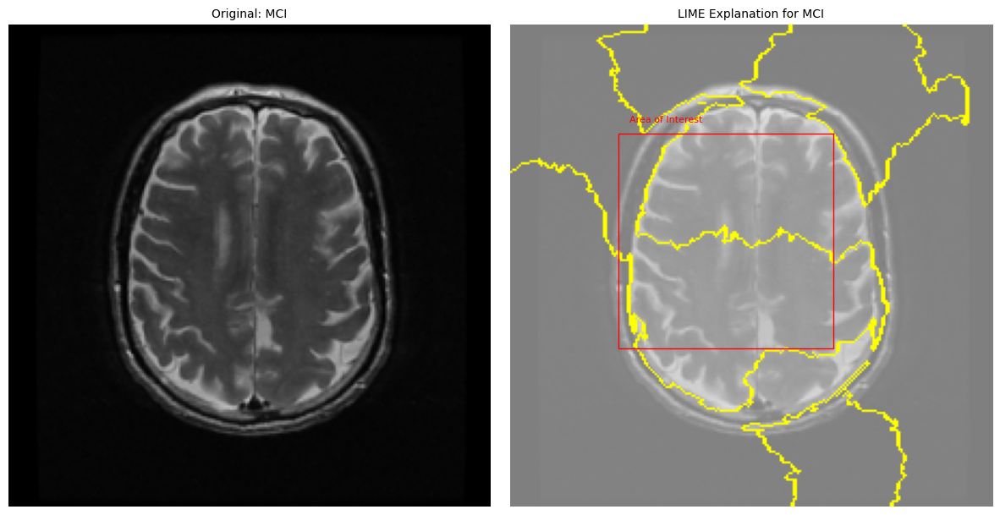

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


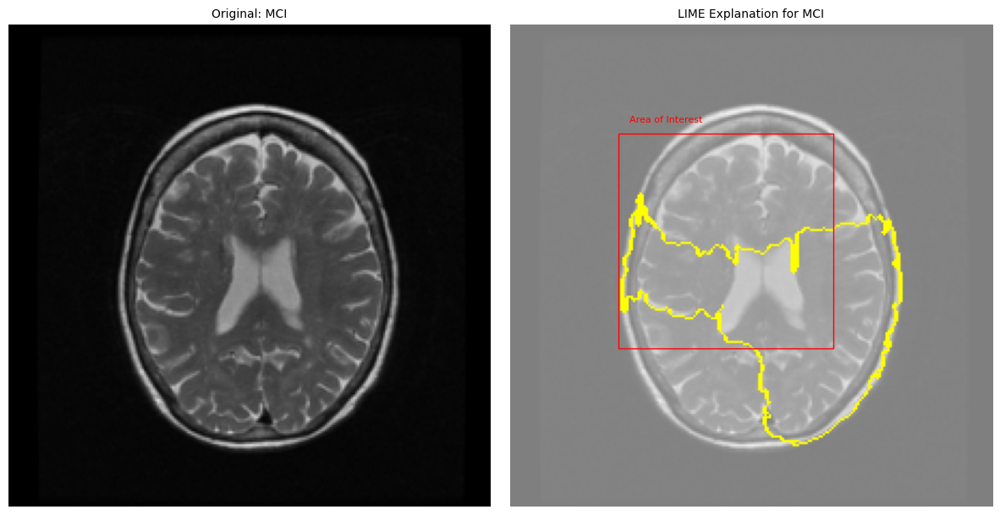

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 996ms/step


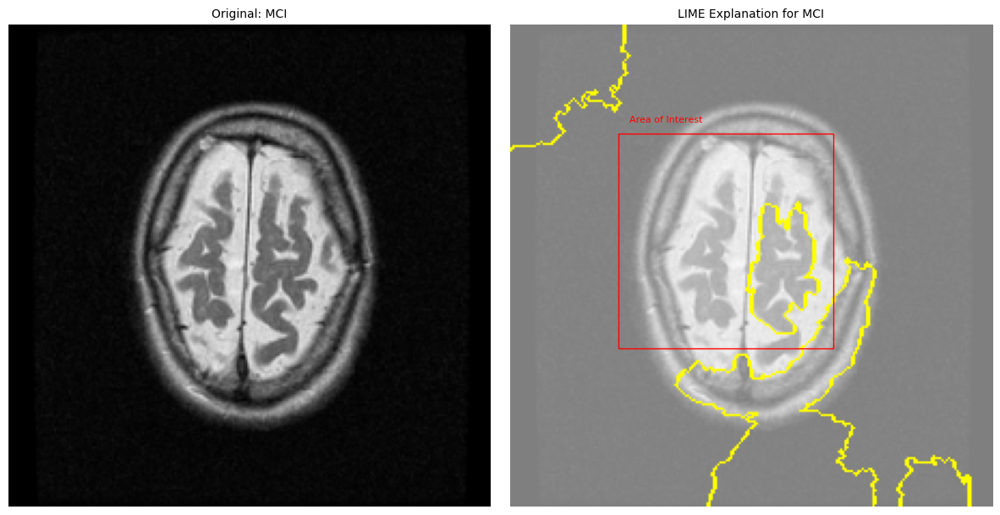

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


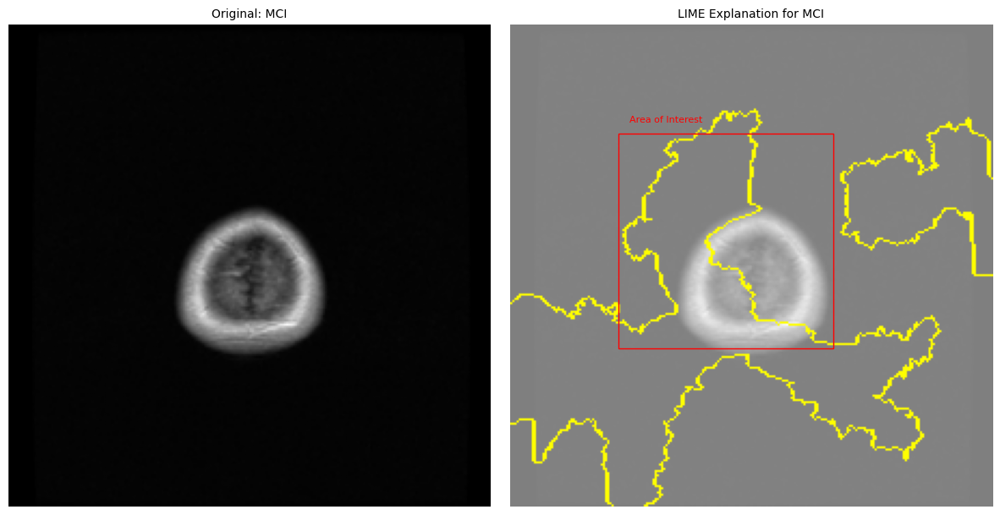

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 997ms/step


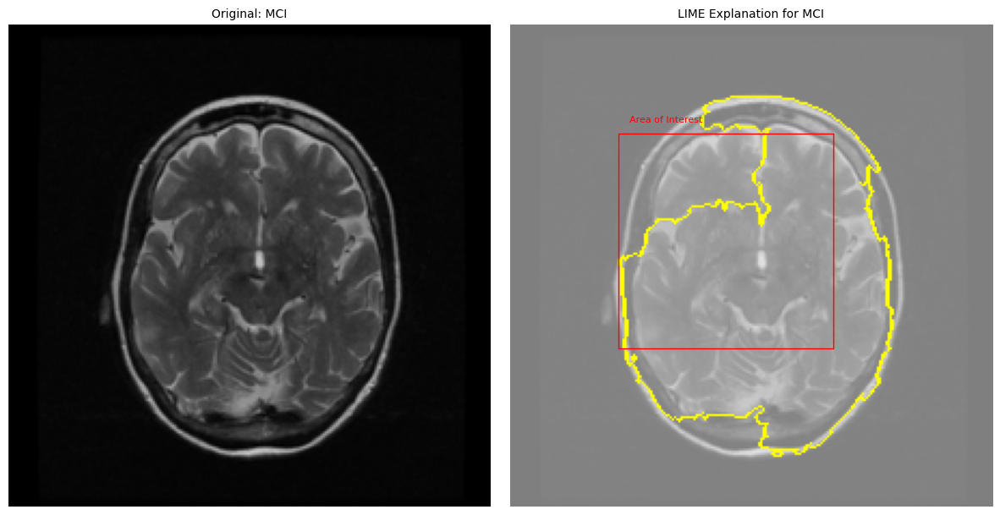

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 990ms/step


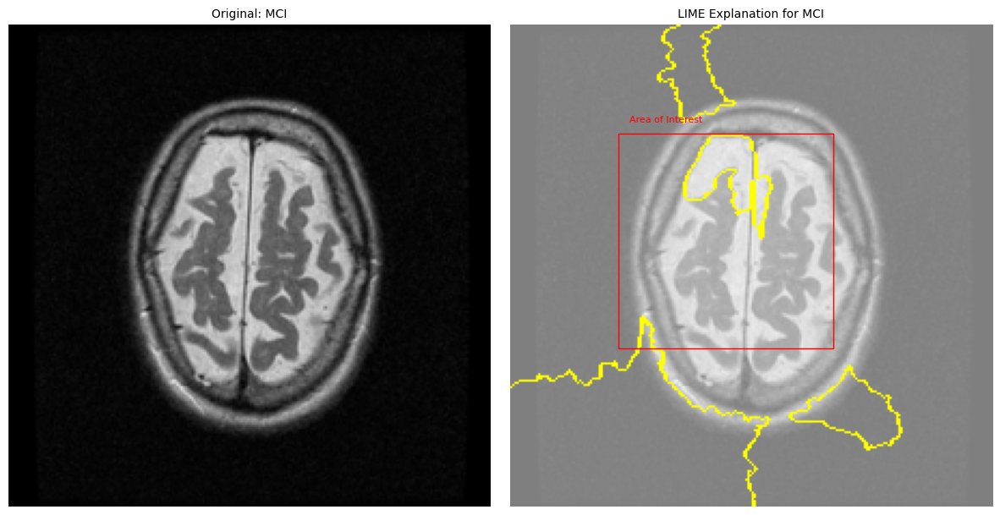

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


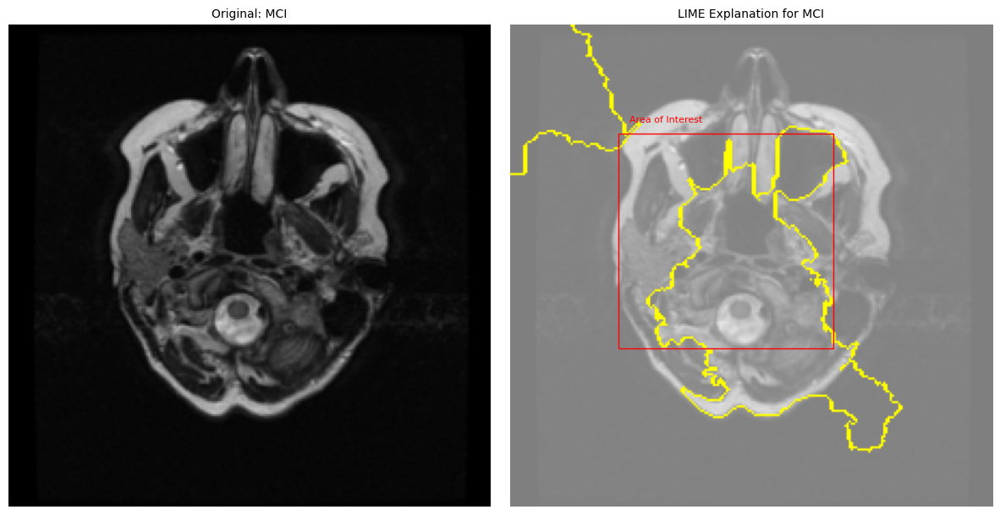

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


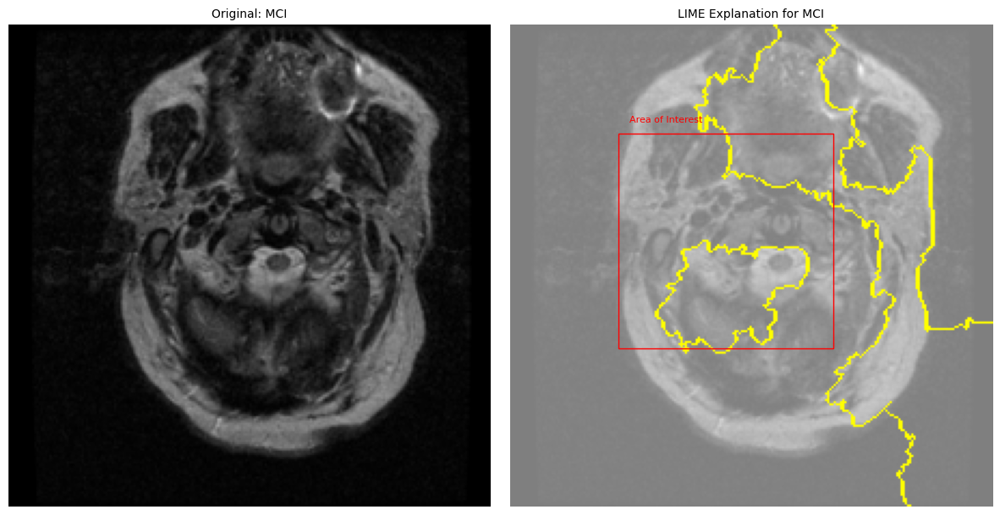

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


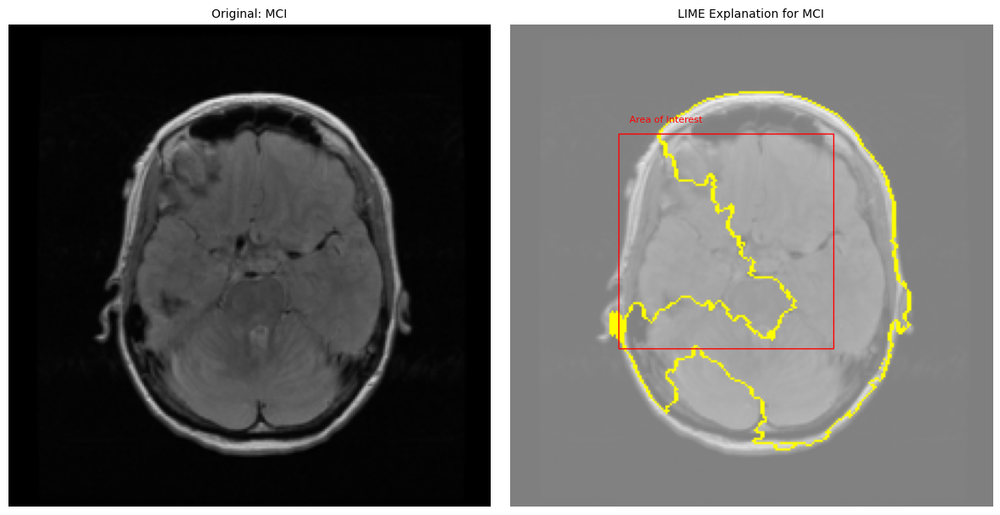

In [ ]:
# Mapping of numerical labels to their string names
label_to_name = {0: "MCI", 1: "AD", 2: "CN"}

# Randomly select 20 image paths and their corresponding labels
random_indices = np.random.choice(len(test_image_paths), 20, replace=False)
selected_image_paths = [test_image_paths[i] for i in random_indices]
selected_labels = [test_labels[i] for i in random_indices]

for img_path, true_label in zip(selected_image_paths, selected_labels):
    image = preprocess_image(img_path)
    predictions = model.predict(np.expand_dims(image, axis=0), verbose=0)

    # Converting one-hot encoded true_label to integer label
    true_label_int = np.argmax(true_label)

    explainer = LimeImageExplainer()
    explanation = explainer.explain_instance(image, model.predict, top_labels=3, hide_color=0)

    # Now use true_label_int instead of true_label
    temp, mask = explanation.get_image_and_mask(true_label_int, positive_only=True, hide_rest=False)
    lime_img = mark_boundaries(temp / 2 + 0.5, mask)

    # Determine class label for the true_label
    class_label = label_to_name[true_label_int]  # Use the mapping to get the string name

    # Display them side by side
    show_images_side_by_side(image, lime_img, title=class_label)

In [ ]:
#Save the model
# The '.keras' extension indicates that the model should be saved to HDF5.
model.save('ViT_Final_a_dicom_classification_model.keras')